> крч я сначала делал через сv но это будет потом, в последний момент начал искать какие-то методы для обнаружения именно мест где есть рукописный текст, нашел детектрон <a href = "https://colab.research.google.com/drive/16jcaJoc6bCFAQ96jDe2HwtXj7BMD_-m5#scrollTo=PIbAM2pv-urF"> Detectron2</a>
>> крч это некая хуйня-струтура которая размечает области объектов, на примере ссылки там кони-люди и шары: **САМОЕ ГЛАВНОЕ**, что эта залупа требует нихуевой такой разметки объектов, которую я спиздил <a href = "https://github.com/CatalystCode/Handwriting/tree/master/Data/labelledcontracttrainingdata/trainingjpg_output_99/Annotations_99" a> у них </a>, в том числе и датасет для обучения, датасет не ахти какой для русского случая, только подписи и азерс (ака не подписи) 

> крч эти файлы либо *xml* либо *json* я пока не очень понимаю их структуру построения так как на разных источниках все по разному строится, но видимо необходимость хз
> NB еще есть эти <a href = "https://devblogs.microsoft.com/cse/2018/05/07/handwriting-detection-and-recognition-in-scanned-documents-using-azure-ml-package-computer-vision-azure-cognitive-services-ocr/" a> ребята </a>, наскок я понимал датасет для трейна оригинальный их, но я скипал ибо они юзали что то другое

In [2]:
from pathlib import Path
import cv2
import numpy as np

In [3]:
import pdf2image
#import fitz

In [4]:
import pytesseract
from PIL import Image

In [5]:
import scipy.integrate as integrate
from numpy import sqrt, sin, cos, pi
from math import factorial

In [6]:
from random import choice
import random

In [7]:
import torch
import torchvision

In [8]:
import detectron2
from detectron2.utils.logger import setup_logger
from detectron2.data import DatasetCatalog, MetadataCatalog
from detectron2.structures import BoxMode
from detectron2.utils.visualizer import Visualizer

In [9]:
from detectron2.engine import default_argument_parser
from detectron2.engine import DefaultTrainer
from detectron2.engine import default_setup
from detectron2.config import get_cfg
from detectron2.engine import default_argument_parser
from detectron2.engine import DefaultPredictor
from detectron2 import model_zoo

In [10]:
import os 
import glob 
import time
import xml.etree.ElementTree as ET
from fvcore.common.file_io import PathManager

In [11]:
from matplotlib.pyplot import figure
from matplotlib import pyplot as plt

## **крч бля я ебал того рот комментировать**

### *шаги внизу ебать пиздец*

### здесь реализация ака  balloon_voc из detecron2, хотя у них это сделано через единый json still заебистая хуйня

In [11]:
def dectron_voc(directory, mark, classes):

    with PathManager.open(os.path.join(directory, mark+".txt")) as f: # берем текстовый файл с перечислением объектов xml jpg
        fileids = np.loadtxt(f, dtype=np.str)

    dicts = []
    for fileid in fileids: # берем для каждого файла из текста его графический и размеченный образ
        anno_file = os.path.join(directory, "Annotations", fileid + ".xml")
        jpeg_file = os.path.join(directory, "JPEGImages", fileid + ".jpg")

        tree = ET.parse(anno_file)

        r = {
            "file_name": jpeg_file, # имя файла в xml (pov) json вариант выглядит проще
            "image_id": fileid, # как я понял эта часть отвечат за номер страницы документа
            "height": int(tree.findall("./size/height")[0].text), # размеры объекта
            "width": int(tree.findall("./size/width")[0].text), # ...
        }
        instances = []
        for obj in tree.findall("object"): # здесь идет описание объекта внутри картинки
            cls = obj.find("name").text # здесь объекту присваивается класс подпись или другое
            bbox = obj.find("bndbox") # здесь бинды на координаты объекта хз как их правильно выставлять
            bbox = [float(bbox.find(x).text) for x in ["xmin", "ymin", "xmax", "ymax"]] 
            # наскок я понял область рисовалась квадаратами тк xml предлагает 4 точки x1 x2 y1 y2 что есть квадрат
            bbox[0] -= 1.0 # здесь зачем то требовался максимальный шаг по зоне обхода объектов хз
            bbox[1] -= 1.0
            instances.append(
                {"category_id": classes.index(cls), "bbox": bbox, "bbox_mode": BoxMode.XYXY_ABS})
        r["annotations"] = instances
        dicts.append(r)
    return dicts

In [ ]:
# здесь происходит регистрация датасета в виртуальных база детектрона, после рестарта все сносится
# для регистрации необходимо 4 вещи dectron vocabulary и названаие каталога список объектов и классы

In [13]:
def register_voc(name, directory, mark, classes):
    if catalog not in DatasetCatalog.list():
        DatasetCatalog.register(catalog, lambda: dectron_voc(directory, mark, classes))
    MetadataCatalog.get(catalog).set(thing_classes=classes, mark=mark, directory = directory, year=2022)

In [14]:
register_voc('signature_dataset_2022', directory='datasets', mark='train', classes=["signature","others"])

### здесь я подгружаю конфиги как в примере по ссылке с шариками для обучения, конфиги и модель в теории можно выбирать любые а их там дохуя

In [12]:
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml"))
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5 
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml")

### в данных конфигах написано куча огрызков и остатков от прошлых моделей, надо исправлять в ручную

In [13]:
cfg.MODEL.DEVICE = 'cpu' # у маков cuda enabled
cfg.DATASETS.TRAIN = ("signature_dataset_2022",) # зарегестрированный датасет
cfg.DATASETS.TEST = () # тестовая часть отсутствует, хотя ее можно создать

In [14]:
cfg.SOLVER.MAX_ITER = 10 # я пздц ебал того рот у меня эта хуйня считалась вечность
# почти во всех примерах по детектрону 300 - это мало 10к - уже норм
'''а мак видимо слабоват для таких мощностей и грелся что пиздец мне нахуй это не надо техника дорогая 10 итераций осилил и слава богу'''
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128
cfg.SOLVER.STEPS = []
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 2 # наскок я понимаю класса два 

In [15]:
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True) #  создаем атупт директоритю по дефолту она аутпут куда выгрузятся модели
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

[05/07 21:33:19 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

KeyError: "Dataset 'signature_dataset_aaa' is not registered! Available datasets are: coco_2014_train, coco_2014_val, coco_2014_minival, coco_2014_valminusminival, coco_2017_train, coco_2017_val, coco_2017_test, coco_2017_test-dev, coco_2017_val_100, keypoints_coco_2014_train, keypoints_coco_2014_val, keypoints_coco_2014_minival, keypoints_coco_2014_valminusminival, keypoints_coco_2017_train, keypoints_coco_2017_val, keypoints_coco_2017_val_100, coco_2017_train_panoptic_separated, coco_2017_train_panoptic_stuffonly, coco_2017_train_panoptic, coco_2017_val_panoptic_separated, coco_2017_val_panoptic_stuffonly, coco_2017_val_panoptic, coco_2017_val_100_panoptic_separated, coco_2017_val_100_panoptic_stuffonly, coco_2017_val_100_panoptic, lvis_v1_train, lvis_v1_val, lvis_v1_test_dev, lvis_v1_test_challenge, lvis_v0.5_train, lvis_v0.5_val, lvis_v0.5_val_rand_100, lvis_v0.5_test, lvis_v0.5_train_cocofied, lvis_v0.5_val_cocofied, cityscapes_fine_instance_seg_train, cityscapes_fine_sem_seg_train, cityscapes_fine_instance_seg_val, cityscapes_fine_sem_seg_val, cityscapes_fine_instance_seg_test, cityscapes_fine_sem_seg_test, cityscapes_fine_panoptic_train, cityscapes_fine_panoptic_val, voc_2007_trainval, voc_2007_train, voc_2007_val, voc_2007_test, voc_2012_trainval, voc_2012_train, voc_2012_val, ade20k_sem_seg_train, ade20k_sem_seg_val"

In [47]:
%load_ext tensorboard
%tensorboard --logdir output

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [4]:
#тест

In [44]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth") 
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.3 # 0.3 вроде норм размечает но слишком активно
predictor = DefaultPredictor(cfg)

[05/07 20:32:04 d2.checkpoint.c2_model_loading]: Following weights matched with model:
| Names in Model                                  | Names in Checkpoint                                                                                  | Shapes                                          |
|:------------------------------------------------|:-----------------------------------------------------------------------------------------------------|:------------------------------------------------|
| backbone.bottom_up.res2.0.conv1.*               | backbone.bottom_up.res2.0.conv1.{norm.bias,norm.running_mean,norm.running_var,norm.weight,weight}    | (64,) (64,) (64,) (64,) (64,64,1,1)             |
| backbone.bottom_up.res2.0.conv2.*               | backbone.bottom_up.res2.0.conv2.{norm.bias,norm.running_mean,norm.running_var,norm.weight,weight}    | (64,) (64,) (64,) (64,) (64,64,3,3)             |
| backbone.bottom_up.res2.0.conv3.*               | backbone.bottom_up.res2.0.conv3.{norm.bia

1.478214979171753
stamp4.jpg


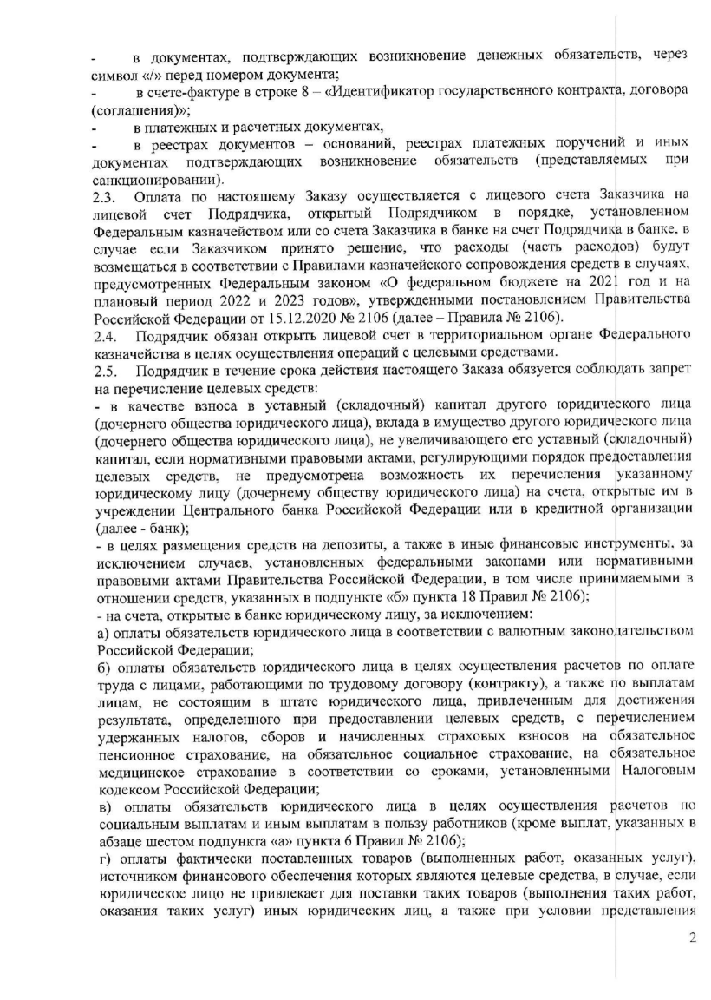

1.3981940746307373
stamp5.jpg


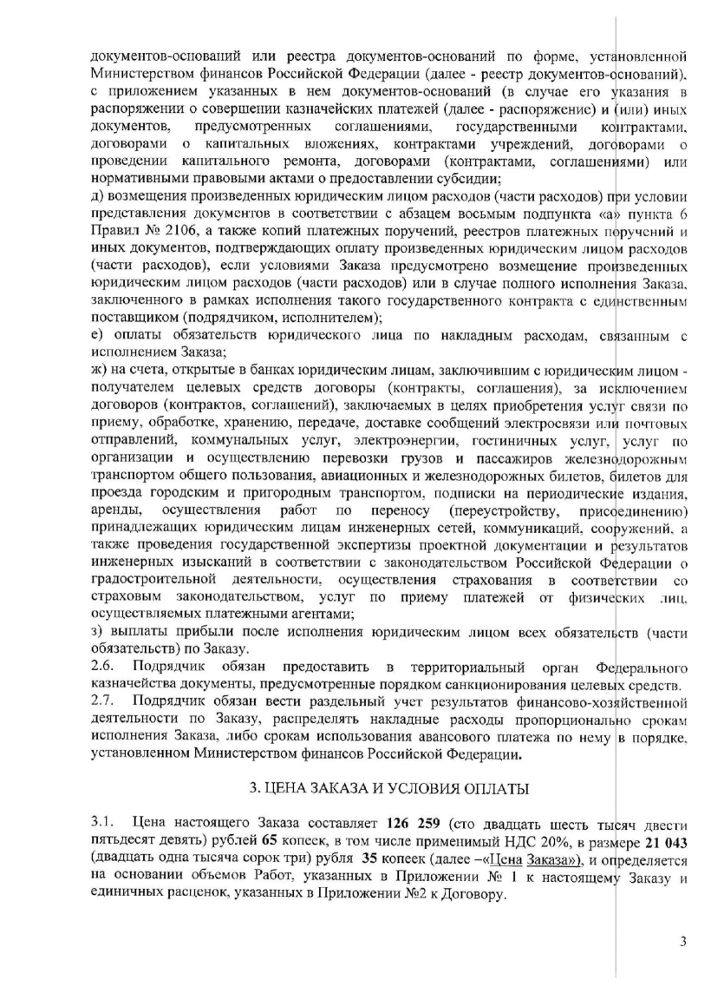

1.2830810546875
stamp10.jpg


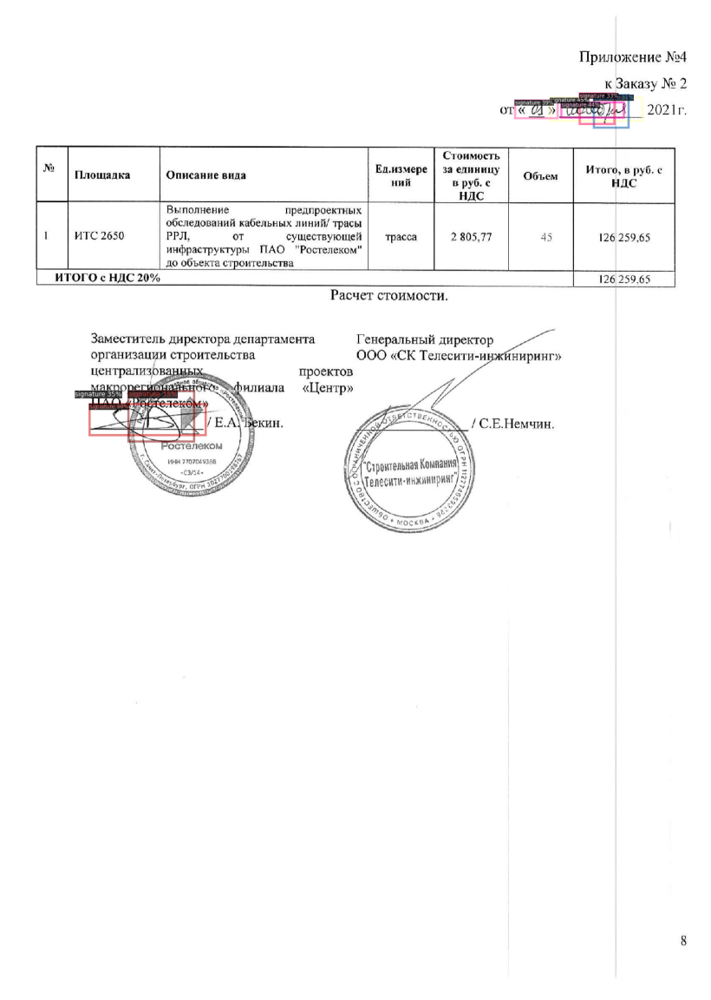

1.2408549785614014
stamp7.jpg


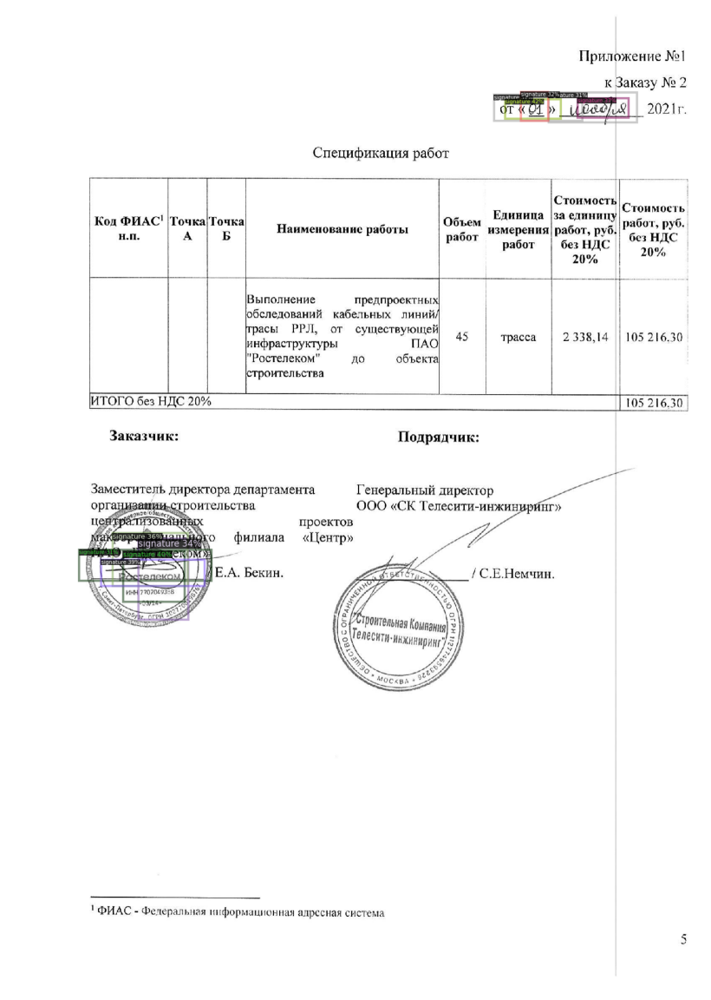

1.319133996963501
stamp6.jpg


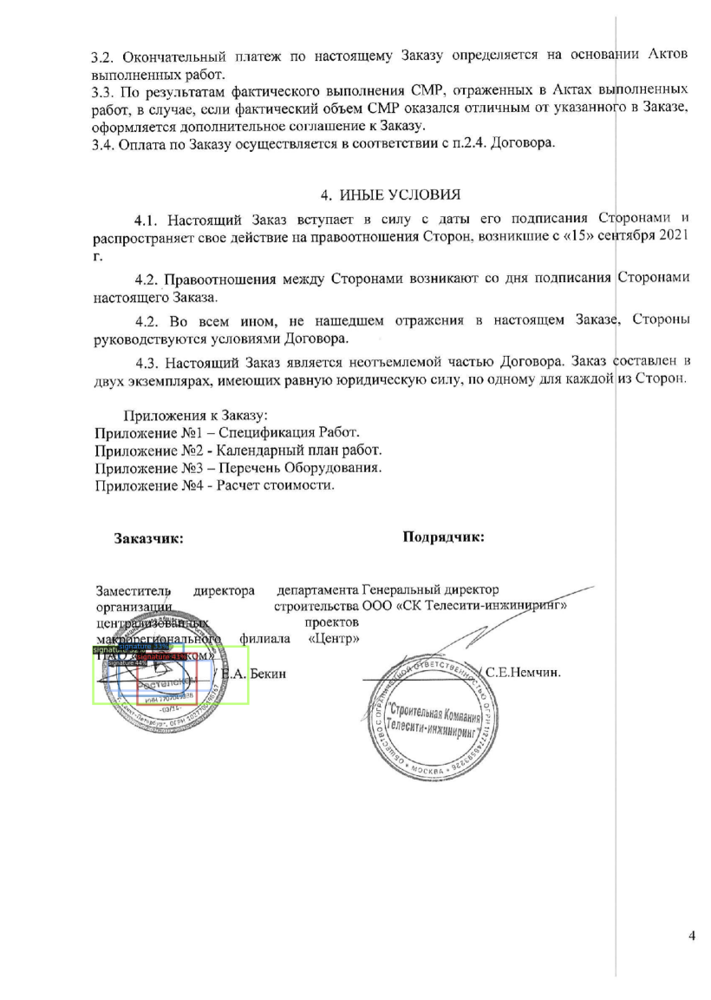

1.3252758979797363
stamp2.jpg


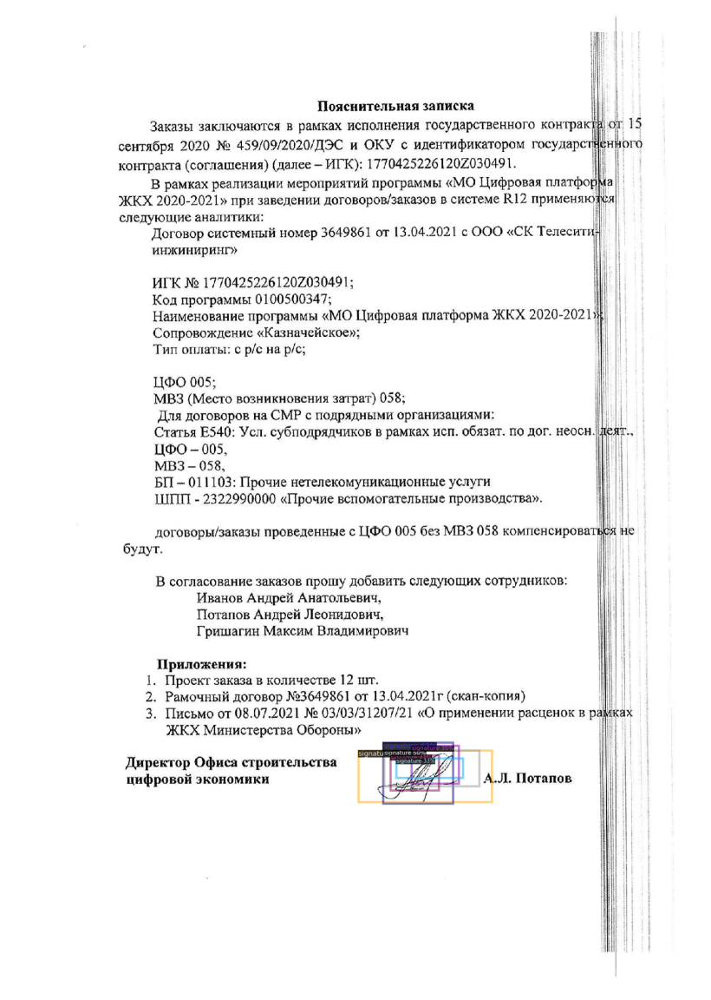

1.3188838958740234
stamp3.jpg


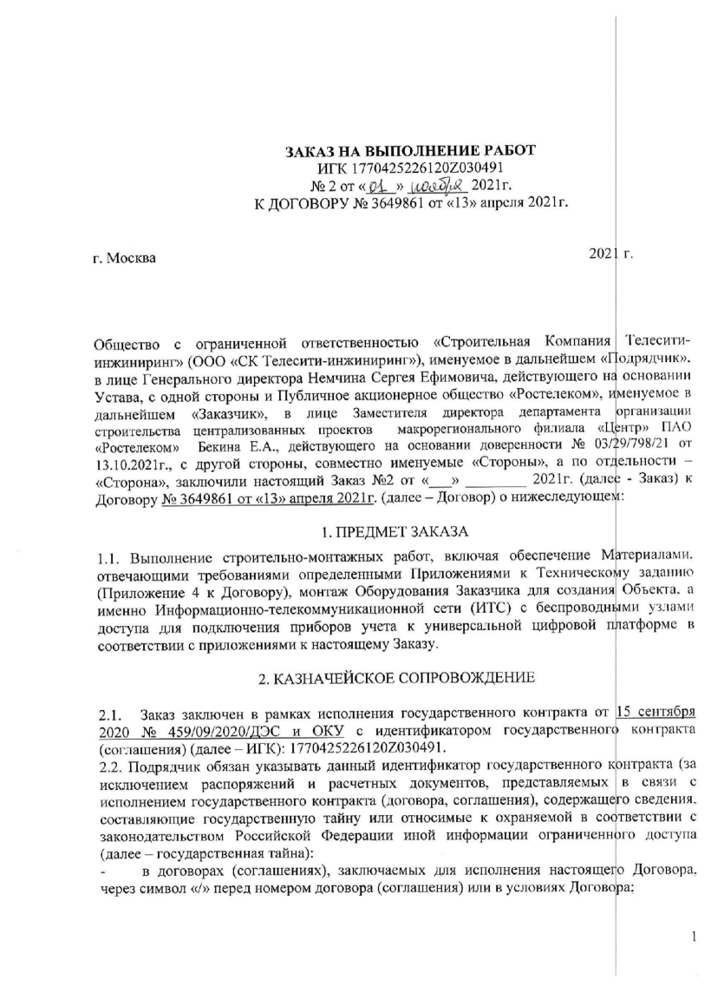

1.3852221965789795
stamp1.jpg


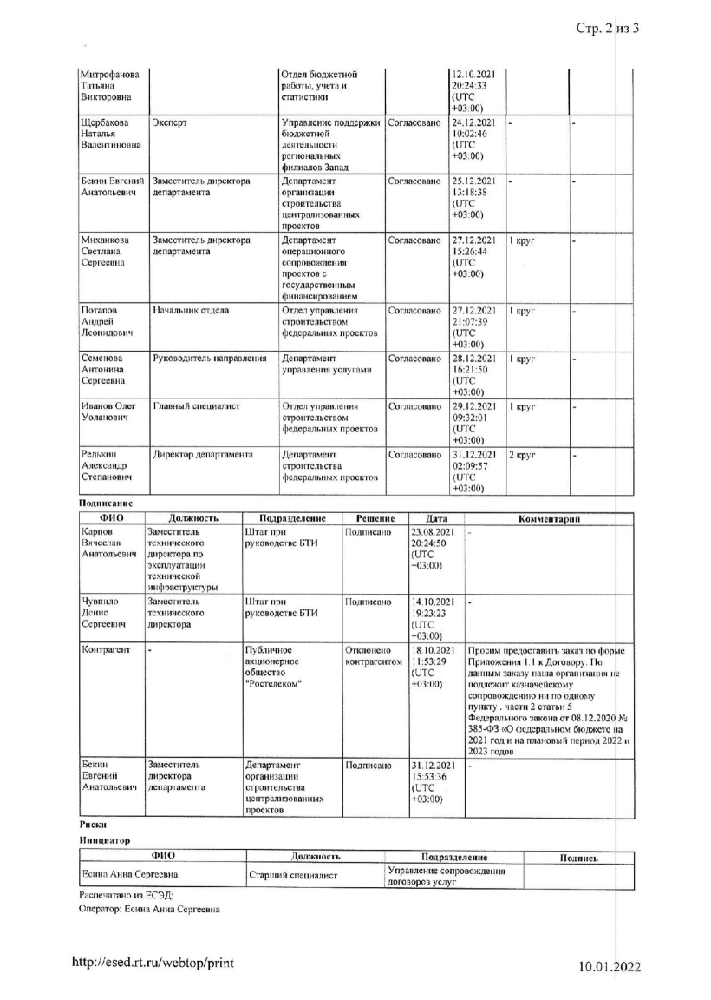

1.4168808460235596
stamp0.jpg


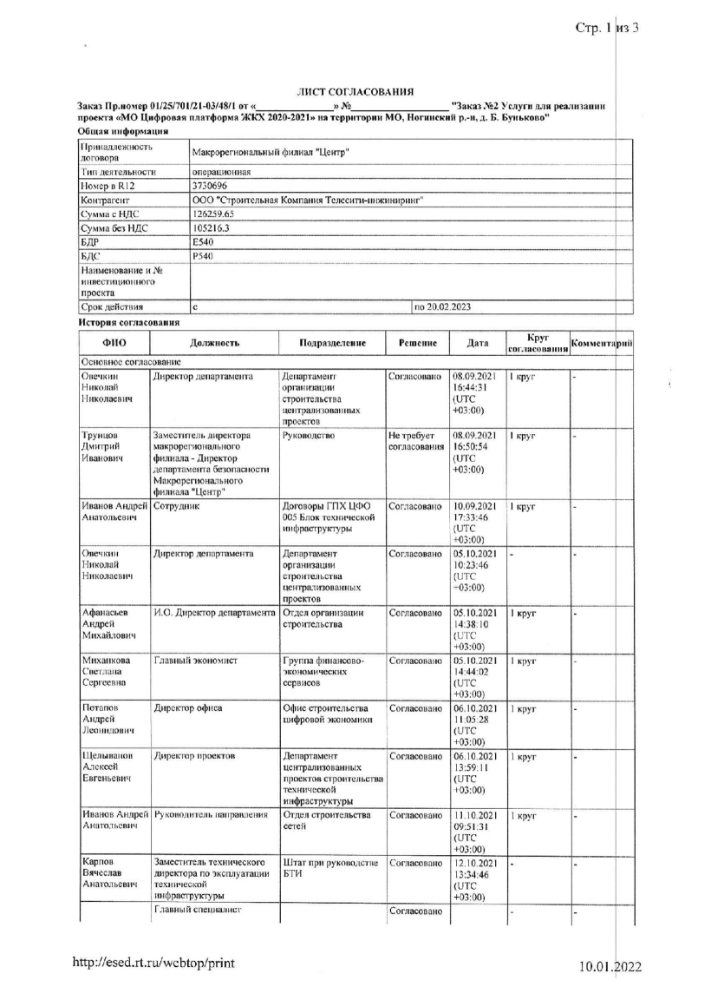

1.4554872512817383
akatsuki1.jpg


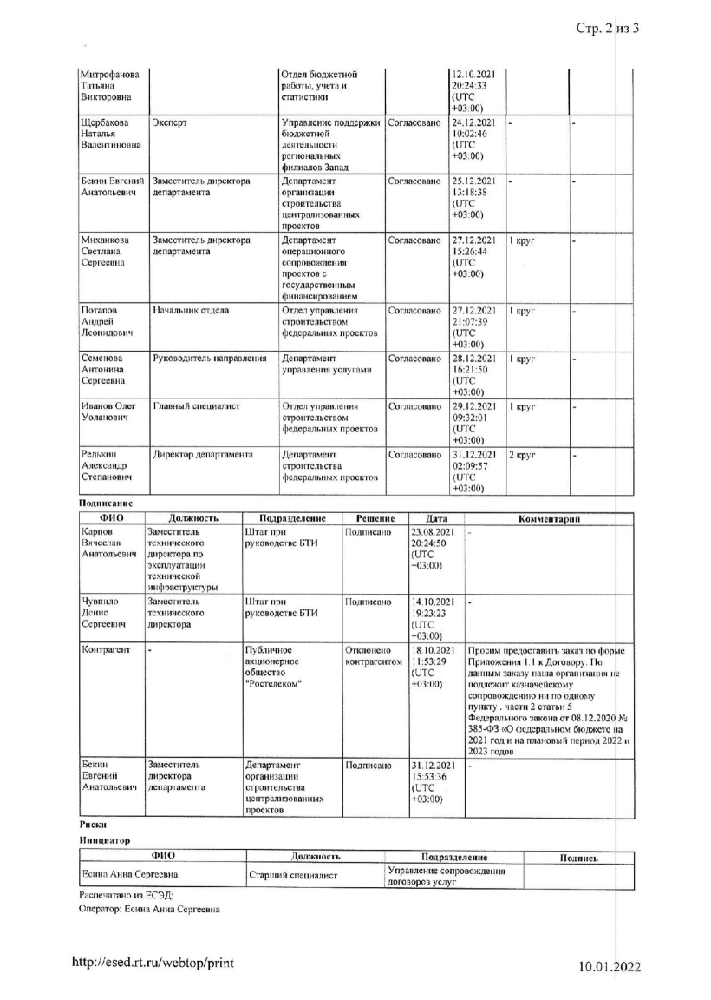

In [46]:
files = glob.glob("*.jpg")
sample_size = 10
for file,_ in zip(files,range(sample_size)):
    im = cv2.imread(file)
    MetadataCatalog.get("signature_dataset_train").thing_classes = ["signature","others"]
    start_time = time.time()
    outputs = predictor(im)
    print(time.time()- start_time)
    
    v = Visualizer(im[:, :, ::-1], metadata=MetadataCatalog.get("signature_dataset_train"), scale=0.8)
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    print(file)
    figure(num=None, figsize=(15, 15), dpi=100, facecolor='w', edgecolor='k')
    plt.axis("off")
    plt.imshow(v.get_image()[:, :, ::-1])
    plt.show()

# CV

In [8]:
pdf2image.convert_from_path

<function pdf2image.pdf2image.convert_from_path(pdf_path, dpi=200, output_folder=None, first_page=None, last_page=None, fmt='ppm', jpegopt=None, thread_count=1, userpw=None, use_cropbox=False, strict=False, transparent=False, single_file=False, output_file=<pdf2image.generators.ThreadSafeGenerator object at 0x107ec3b50>, poppler_path=None, grayscale=False, size=None, paths_only=False, use_pdftocairo=False, timeout=None, hide_annotations=False)>

In [10]:
pdf_file = "Sasuke_Uchiha.pdf"

In [11]:
pages = pdf2image.convert_from_path(pdf_file) # перевод pdf в jpgs

In [12]:
for i in range(len(pages)):
    pages[i].save('akatsuki'+ str(i) +'.jpg', 'JPEG')

In [13]:
def imshow(img, showAxis = False, size=(40,30)): # функция для отрисовки imread cv2
    plt.figure(figsize=size)
    if not showAxis: plt.axis('off')
    if len(img.shape) == 3: plt.imshow(img[:,:,::-1])
    else: plt.imshow(img, cmap='gray')

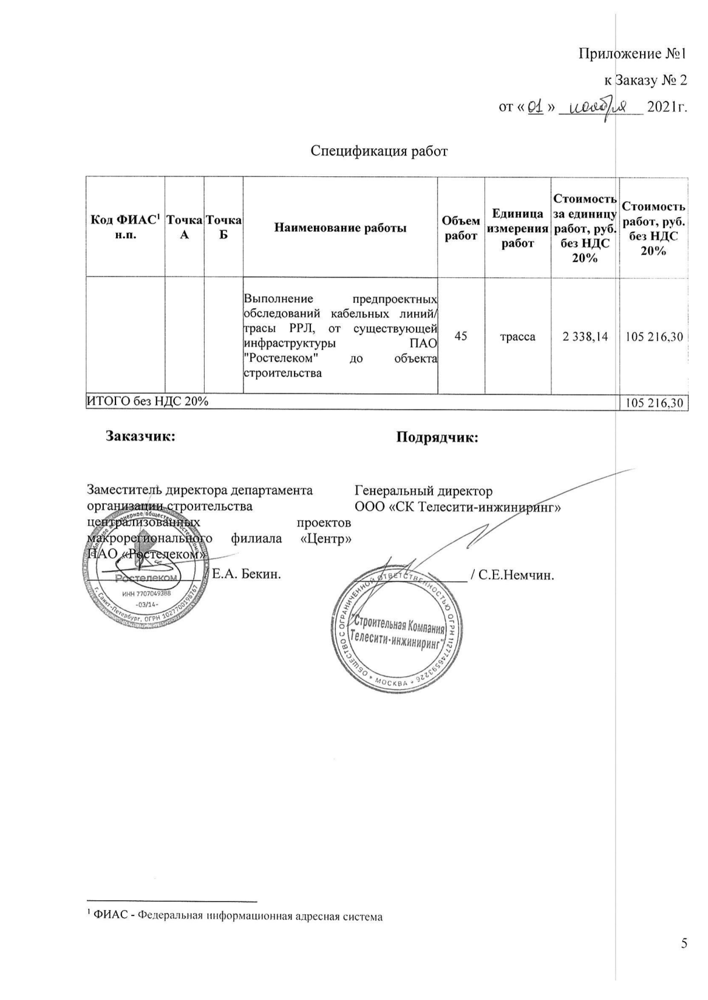

In [14]:
imshow(cv2.imread('akatsuki7.jpg'))

In [12]:
text = pytesseract.image_to_string(Image.open('akatsuki7.jpg'), lang = 'rus') 

In [13]:
text # pytesseract неплохо читает jpg-pdf текст вбитый руками 

'Спецификация работ\n\nПриложение №1\n\nк Заказу №2\n\nот«б4 » И Л 2021г.\n\nСтоимость , |\nЕдиница |за единицу Стоимость,\nКод ФИАС! ТочкаТочка Объем работ, руб.\nНаименование работы измерения | работ, руб: , |\nн.п. А Б работ без НДС\nработ без НДС 20° |\n20% у\nВыполнение предпроектных\nобследований кабельных линий |\nтрасы РРЛ, от существующей\nинфраструктуры ПАО 45 трасса 2338,14 | 105 216,30\n"Ростелеком" до объекта!\nстроительства\nИТОГО без НДС 20% 105 216,30\nЗаказчик: Подрядчик:\n\nЗаместитель директора департамента\n\nпроектов\n\nфилиала «Центр»\n\n`ФИАС - Федеральная информационная адресная система\n\nГенеральный директор\nООО «СК Телесити-инжин\n\n/ С.Е.Немчин.\n\n+\n\n=”\n\n'

In [24]:
img = cv2.imread('akatsuki7.jpg')

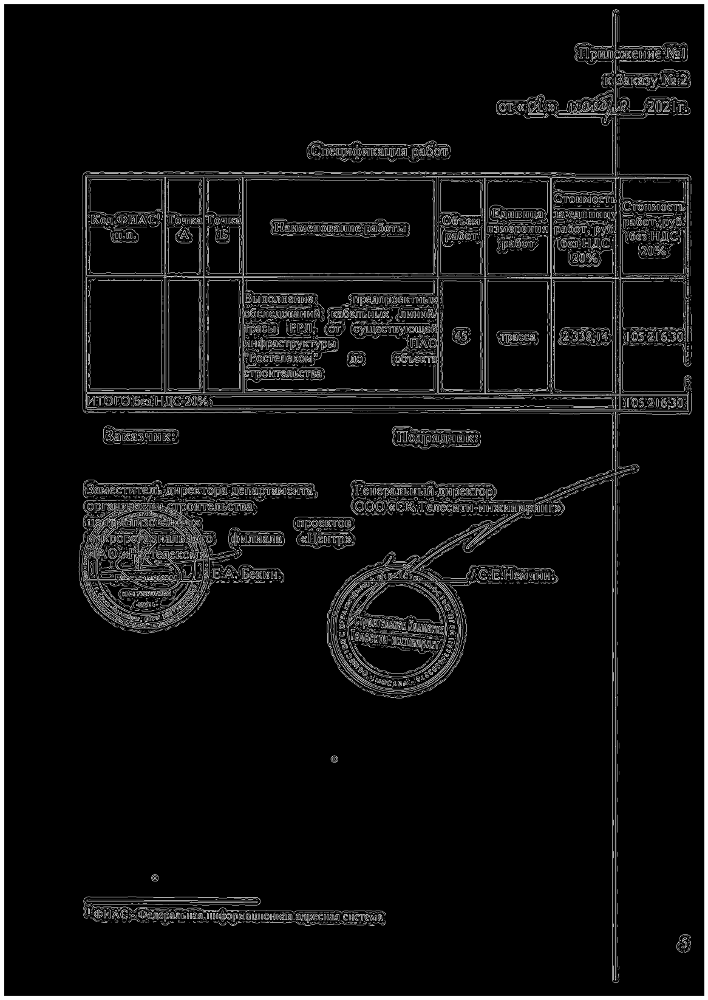

In [25]:
gray = cv2.cvtColor(img.copy(), cv2.COLOR_BGR2HSV) #GRAY фильтр можно и второй
gray = cv2.GaussianBlur(gray,(5,5),0)


blur = cv2.bilateralFilter(gray.copy(), 15, 15, 15 )

def auto_canny(grayim, sigma=.1): # фильтр на угловой градиент для отрисовки границ
    v = np.median(grayim)
    lower = int(max(0, (1.0 - sigma) * v))
    upper = int(min(255, (1.0 + sigma) * v))
    edged = cv2.Canny(grayim, lower, upper)
    return edged

edged = auto_canny(blur)
imshow(edged)


In [28]:
contours, _ = cv2.findContours(image=edged.copy(), mode=cv2.RETR_EXTERNAL, method=cv2.CHAIN_APPROX_NONE)
print(f'Total nr of contours found: {len(contours)}')

topN = 10
sorted_contours = sorted(contours, key=cv2.contourArea, reverse=True)                     
sorted_contours = sorted_contours[:topN]

Total nr of contours found: 5614


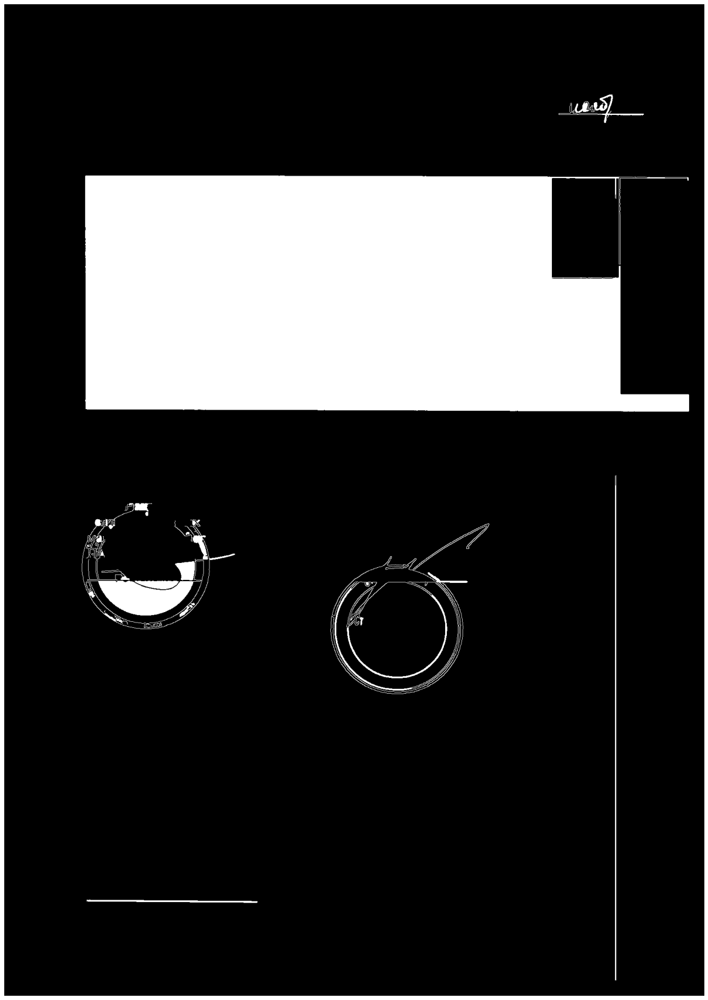

In [29]:
filteredCircle = np.zeros((img.shape[:2]), dtype =np.uint8)
cv2.drawContours(image=filteredCircle, contours=sorted_contours, contourIdx=-1, color=(255, 255, 255), thickness=cv2.FILLED)
imshow(filteredCircle)

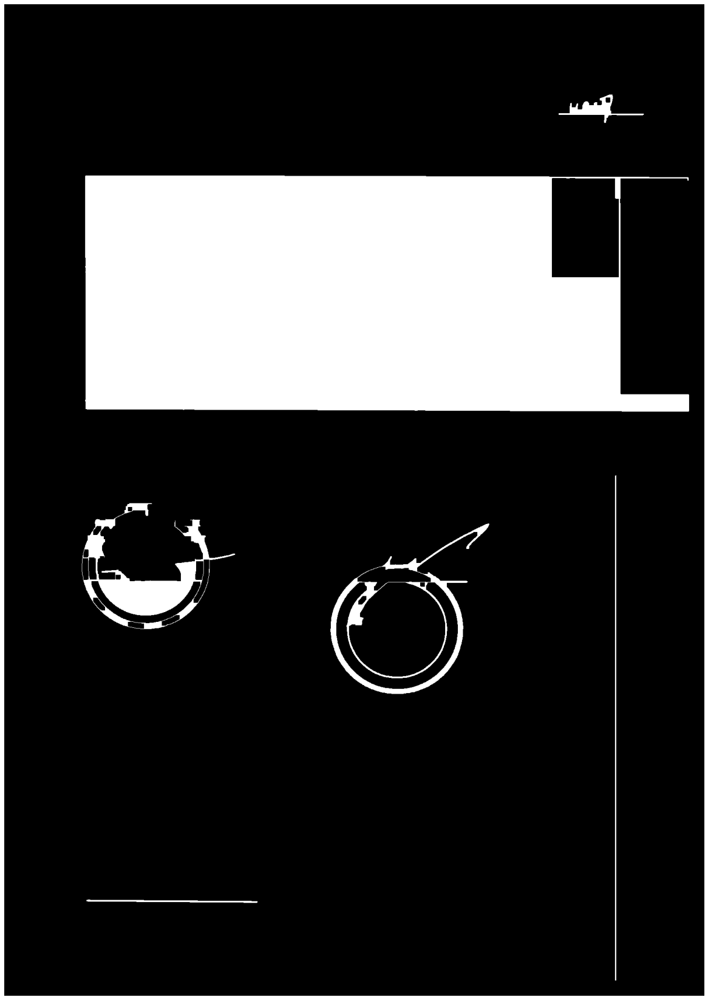

In [30]:
kernel = np.ones((9,9),np.uint8)
closedCircle = cv2.morphologyEx(filteredCircle, cv2.MORPH_CLOSE, kernel, iterations=1)
imshow(closedCircle)

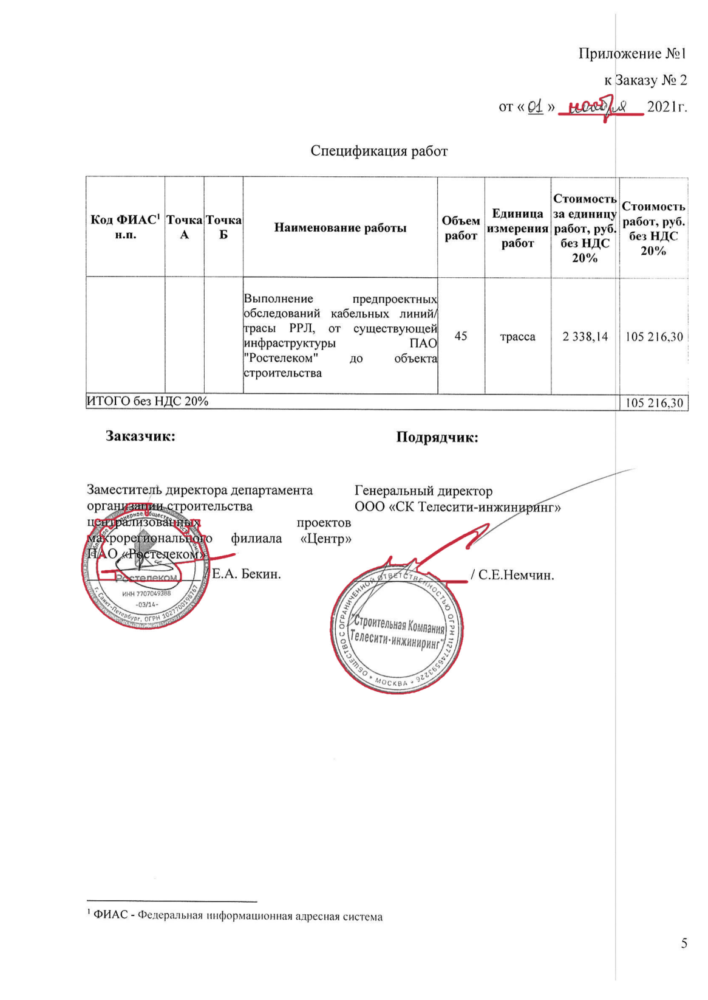

In [36]:
filteredContours, _ = cv2.findContours(image=closedCircle.copy(), mode=cv2.RETR_EXTERNAL, method=cv2.CHAIN_APPROX_NONE)

circleContours = []
for index, contour in enumerate(filteredContours):
    perimeter = cv2.arcLength(contour,True)
    approxPoints = cv2.approxPolyDP(contour, 0.02 * perimeter, True)
    if len(approxPoints) > 6: 
        circleContours.append(contour)

out = img.copy()
cv2.drawContours(image=out, contours=circleContours, contourIdx=-1, color=(60,40,200), thickness=2, lineType=cv2.LINE_AA)
imshow(out)

In [39]:
white = cv2.imread('white.jpg')

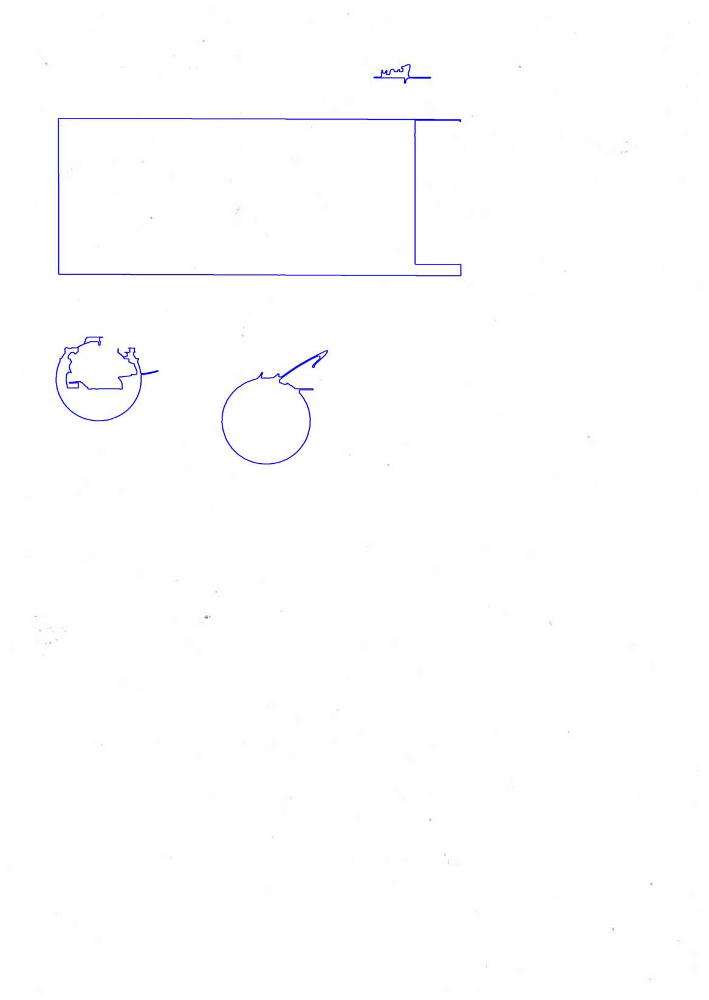

In [40]:
out = white.copy()
cv2.drawContours(image=out, contours=circleContours, contourIdx=-1, color=(255,0, 0), thickness=2, lineType=cv2.LINE_AA)
imshow(out)

In [41]:
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

blurred = cv2.bilateralFilter(gray,10,50,50) #cv2.medianBlur(gray, 25)

minDist = 200
param1 = 500 #500
param2 = 100 #200 #smaller value-> more false circles
minRadius = 20
maxRadius = 170 #10

# docstring of HoughCircles: HoughCircles(image, method, dp, minDist[, circles[, param1[, param2[, minRadius[, maxRadius]]]]]) -> circles
circles = cv2.HoughCircles(blurred, cv2.HOUGH_GRADIENT, 1, minDist, param1=param1, param2=param2, minRadius=minRadius, maxRadius=maxRadius)

if circles is not None:
    circles = np.uint16(np.around(circles))
    for i in circles[0,:]:
        cv2.circle(img, (i[0], i[1]), i[2], (0, 255, 0), 5)


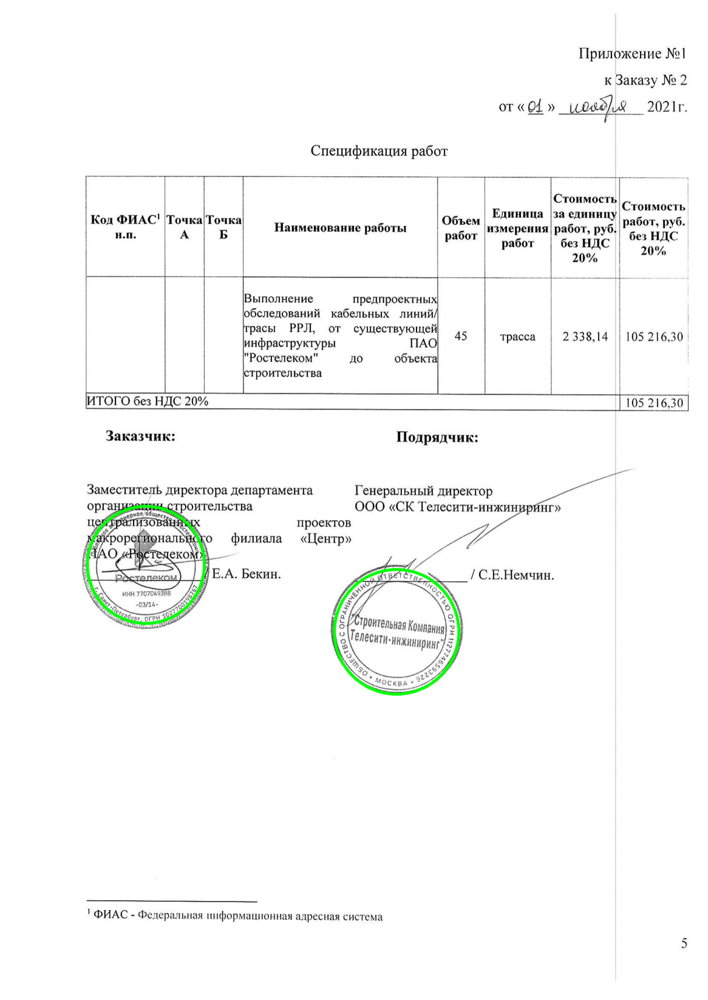

In [45]:
imshow(img)

gray = cv2.cvtColor(cropped_image.copy(), cv2.COLOR_BGR2GRAY)

edges = cv2.Canny(gray, 100,200, apertureSize = 3)


imshow(edges)


In [ ]:
img = cv2.imread('stamp10.jpg')
cropped_image = img[850:1250, 280:1100]
gray = cv2.cvtColor(cropped_image.copy(), cv2.COLOR_BGR2GRAY)
edges = cv2.Canny(gray, 100,200, apertureSize = 3)

In [ ]:
minLineLength = 50
maxLineGap = 5
lines = cv2.HoughLinesP(edges,3,np.pi/180,20,minLineLength=minLineLength,maxLineGap=maxLineGap)
for x in range(0, len(lines)):
    for x1,y1,x2,y2 in lines[x]:
        cv2.line(cropped_image,(x1,y1),(x2,y2),(0,255,0),2)

In [ ]:
imshow(cropped_image)

In [ ]:
img = cv2.imread('stamp10.jpg')
image = img[850:1250, 280:1100]
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
thresh = cv2.threshold(gray, 0, 300, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]

close_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (15,3))
close = cv2.morphologyEx(thresh, cv2.MORPH_CLOSE, close_kernel, iterations=1)

dilate_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (5,3))
dilate = cv2.dilate(close, dilate_kernel, iterations=1)

cnts = cv2.findContours(dilate, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
cnts = cnts[0] if len(cnts) == 2 else cnts[1]
for c in cnts:
    area = cv2.contourArea(c)
    if area > 100 and area < 15000:
        x,y,w,h = cv2.boundingRect(c)
        cv2.rectangle(image, (x, y), (x + w, y + h),(255,255,255), -1)

In [ ]:
image_copy = image.copy()
minLineLength = 30
maxLineGap = 2
gray = cv2.cvtColor(image_copy.copy(), cv2.COLOR_BGR2GRAY)
edges = cv2.Canny(gray, 100,200, apertureSize = 3)
lines = cv2.HoughLinesP(edges,3,np.pi/60,2,minLineLength=minLineLength,maxLineGap=maxLineGap)
for x in range(0, len(lines)):
    for x1,y1,x2,y2 in lines[x]:
        cv2.line(image_copy,(x1,y1),(x2,y2),(0,255,0),2)

In [ ]:
imshow(image_copy)